In [1]:
# EDA를 위한 패키지들
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

# warning 무시

import warnings
warnings.filterwarnings(action='ignore')

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [2]:
plt.rc('font', family='AppleGothic')
# 유니코드에서  음수 부호설정
mpl.rc('axes', unicode_minus=False) # False로 해야 - 부호가 안깨짐

In [3]:
train = pd.read_csv("./data/external_open/countrywide_accident.csv")
train

,ID,사고일시,요일,기상상태,시군구,도로형태,노면상태,사고유형,사고유형 - 세부분류,법규위반,...,가해운전자 상해정도,피해운전자 차종,피해운전자 성별,피해운전자 연령,피해운전자 상해정도,사망자수,중상자수,경상자수,부상자수,ECLO
0,COUNTRYWIDE_ACCIDENT_000000,2019-01-01 00,화요일,맑음,서울특별시 강서구 방화동,교차로 - 교차로횡단보도내,건조,차대사람,횡단중,보행자보호의무위반,...,상해없음,보행자,남,40세,경상,0,0,1,0,3
1,COUNTRYWIDE_ACCIDENT_000001,2019-01-01 00,화요일,맑음,경기도 포천시 소흘읍,교차로 - 교차로안,건조,차대차,기타,직진우회전진행방해,...,상해없음,이륜,남,20세,경상,0,0,1,0,3
2,COUNTRYWIDE_ACCIDENT_000002,2019-01-01 00,화요일,맑음,경기도 양주시 고암동,교차로 - 교차로안,건조,차대차,측면충돌,신호위반,...,상해없음,이륜,남,17세,중상,0,1,0,0,5
3,COUNTRYWIDE_ACCIDENT_000003,2019-01-01 00,화요일,맑음,경기도 남양주시 다산동,기타 - 기타,건조,차대사람,횡단중,보행자보호의무위반,...,상해없음,보행자,남,10세,중상,0,2,0,0,10
4,COUNTRYWIDE_ACCIDENT_000004,2019-01-01 00,화요일,맑음,인천광역시 부평구 부평동,교차로 - 교차로안,건조,차대차,측면충돌,신호위반,...,상해없음,승용,남,56세,경상,0,0,2,1,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
602770,COUNTRYWIDE_ACCIDENT_602770,2021-12-31 23,금요일,흐림,부산광역시 해운대구 우동,교차로 - 교차로안,건조,차대차,기타,신호위반,...,상해없음,승합,남,52세,상해없음,0,1,1,0,8
602771,COUNTRYWIDE_ACCIDENT_602771,2021-12-31 23,금요일,맑음,서울특별시 성동구 행당동,단일로 - 기타,건조,차대차,측면충돌,안전거리미확보,...,상해없음,승용,남,71세,경상,0,0,2,0,6
602772,COUNTRYWIDE_ACCIDENT_602772,2021-12-31 23,금요일,맑음,대전광역시 유성구 원신흥동,교차로 - 교차로안,건조,차대차,측면충돌,안전운전불이행,...,상해없음,승용,남,56세,경상,0,0,3,0,9
602773,COUNTRYWIDE_ACCIDENT_602773,2021-12-31 23,금요일,맑음,경기도 화성시 서신면,기타 - 기타,젖음/습기,차량단독,기타,안전운전불이행,...,부상신고,NaN,NaN,NaN,NaN,0,0,0,1,1


In [4]:
train_deacu = pd.read_csv("./data/train.csv")
train_deacu

,ID,사고일시,요일,기상상태,시군구,도로형태,노면상태,사고유형,사고유형 - 세부분류,법규위반,...,가해운전자 상해정도,피해운전자 차종,피해운전자 성별,피해운전자 연령,피해운전자 상해정도,사망자수,중상자수,경상자수,부상자수,ECLO
0,ACCIDENT_00000,2019-01-01 00,화요일,맑음,대구광역시 중구 대신동,단일로 - 기타,건조,차대사람,길가장자리구역통행중,안전운전불이행,...,상해없음,보행자,여,70세,중상,0,1,0,0,5
1,ACCIDENT_00001,2019-01-01 00,화요일,흐림,대구광역시 달서구 감삼동,단일로 - 기타,건조,차대사람,보도통행중,기타,...,상해없음,보행자,남,61세,경상,0,0,1,0,3
2,ACCIDENT_00002,2019-01-01 01,화요일,맑음,대구광역시 수성구 두산동,단일로 - 기타,건조,차대사람,차도통행중,안전운전불이행,...,상해없음,보행자,남,38세,경상,0,0,1,0,3
3,ACCIDENT_00003,2019-01-01 02,화요일,맑음,대구광역시 북구 복현동,단일로 - 기타,건조,차대차,추돌,안전운전불이행,...,상해없음,승용,남,36세,중상,0,1,0,0,5
4,ACCIDENT_00004,2019-01-01 04,화요일,맑음,대구광역시 동구 신암동,단일로 - 기타,건조,차대차,추돌,안전운전불이행,...,상해없음,승용,남,52세,경상,0,0,1,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39604,ACCIDENT_39604,2021-12-31 19,금요일,맑음,대구광역시 수성구 수성동3가,교차로 - 교차로안,건조,차대차,측면충돌,신호위반,...,상해없음,이륜,남,28세,경상,0,0,1,0,3
39605,ACCIDENT_39605,2021-12-31 19,금요일,맑음,대구광역시 달서구 상인동,단일로 - 기타,건조,차대차,측면충돌,안전거리미확보,...,상해없음,승용,남,52세,경상,0,0,1,0,3
39606,ACCIDENT_39606,2021-12-31 21,금요일,맑음,대구광역시 달서구 월성동,교차로 - 교차로안,건조,차대차,측면충돌,교차로운행방법위반,...,중상,승용,남,73세,중상,0,2,0,0,10
39607,ACCIDENT_39607,2021-12-31 22,금요일,맑음,대구광역시 달서구 장동,기타 - 기타,건조,차대차,추돌,안전운전불이행,...,상해없음,승용,여,57세,경상,0,0,1,0,3


In [5]:
def wrangiling(data_set):
    print("==================")
    print("       Shape      ")
    print("==================")

    display(data_set.shape)

    print("==================")
    print("        Info      ")
    print("==================")

    display(data_set.info())

    print("==================")
    print("      Columns     ")
    print("==================")
    
    display(data_set.columns)

    print("==================")
    print("        NaN       ")
    print("==================")

    display(data_set.isna().sum())

    print("==================")
    print("    Duplicated    ")
    print("==================")
    
    display(data_set[data_set.duplicated()])

    print("==================")
    print("    Description   ")
    print("==================")

    display(data_set.describe())

    print("==================")
    print("      Unique      ")
    print("==================")

    display(data_set.nunique())

In [6]:
wrangiling(train)

       Shape      


(602775, 23)

        Info      
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 602775 entries, 0 to 602774
Data columns (total 23 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   ID           602775 non-null  object
 1   사고일시         602775 non-null  object
 2   요일           602775 non-null  object
 3   기상상태         602775 non-null  object
 4   시군구          602775 non-null  object
 5   도로형태         602775 non-null  object
 6   노면상태         602774 non-null  object
 7   사고유형         602775 non-null  object
 8   사고유형 - 세부분류  602775 non-null  object
 9   법규위반         602775 non-null  object
 10  가해운전자 차종     602775 non-null  object
 11  가해운전자 성별     602775 non-null  object
 12  가해운전자 연령     602775 non-null  object
 13  가해운전자 상해정도   602775 non-null  object
 14  피해운전자 차종     576948 non-null  object
 15  피해운전자 성별     576946 non-null  object
 16  피해운전자 연령     576949 non-null  object
 17  피해운전자 상해정도   576946 non-null  object
 18  사망자수         602775 non-n

None

      Columns     


Index(['ID', '사고일시', '요일', '기상상태', '시군구', '도로형태', '노면상태', '사고유형',
       '사고유형 - 세부분류', '법규위반', '가해운전자 차종', '가해운전자 성별', '가해운전자 연령', '가해운전자 상해정도',
       '피해운전자 차종', '피해운전자 성별', '피해운전자 연령', '피해운전자 상해정도', '사망자수', '중상자수',
       '경상자수', '부상자수', 'ECLO'],
      dtype='object')

        NaN       


ID                 0
사고일시               0
요일                 0
기상상태               0
시군구                0
도로형태               0
노면상태               1
사고유형               0
사고유형 - 세부분류        0
법규위반               0
가해운전자 차종           0
가해운전자 성별           0
가해운전자 연령           0
가해운전자 상해정도         0
피해운전자 차종       25827
피해운전자 성별       25829
피해운전자 연령       25826
피해운전자 상해정도     25829
사망자수               0
중상자수               0
경상자수               0
부상자수               0
ECLO               0
dtype: int64

    Duplicated    


,ID,사고일시,요일,기상상태,시군구,도로형태,노면상태,사고유형,사고유형 - 세부분류,법규위반,...,가해운전자 상해정도,피해운전자 차종,피해운전자 성별,피해운전자 연령,피해운전자 상해정도,사망자수,중상자수,경상자수,부상자수,ECLO


    Description   


,사망자수,중상자수,경상자수,부상자수,ECLO
count,602775.000000,602775.000000,602775.000000,602775.000000,602775.000000
mean,0.014994,0.295936,1.075788,0.091031,4.948015
std,0.126911,0.551948,1.045411,0.371401,3.615942
min,0.000000,0.000000,0.000000,0.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,3.000000
50%,0.000000,0.000000,1.000000,0.000000,3.000000
75%,0.000000,1.000000,1.000000,0.000000,6.000000
max,7.000000,31.000000,41.000000,47.000000,245.000000


      Unique      


ID             602775
사고일시            26210
요일                  7
기상상태                6
시군구              4778
도로형태               12
노면상태                7
사고유형                4
사고유형 - 세부분류        16
법규위반               11
가해운전자 차종           12
가해운전자 성별            3
가해운전자 연령           98
가해운전자 상해정도          6
피해운전자 차종           14
피해운전자 성별            3
피해운전자 연령          100
피해운전자 상해정도          6
사망자수                8
중상자수               20
경상자수               35
부상자수               23
ECLO              108
dtype: int64

In [7]:
display(train["경상자수"].value_counts().sort_index())
display(train["부상자수"].value_counts().sort_index())
display(train["중상자수"].value_counts().sort_index())
display(train["사망자수"].value_counts().sort_index())

경상자수
0     158418
1     316780
2      83580
3      26385
4      10563
5       3948
6       1500
7        645
8        333
9        217
10       130
11        85
12        48
13        35
14        21
15        24
16        17
17         7
18         7
19         7
20         3
21         1
22         4
23         2
24         1
25         1
26         2
27         2
28         2
29         2
32         1
34         1
38         1
40         1
41         1
Name: count, dtype: int64

부상자수
0     556045
1      41631
2       3583
3        865
4        345
5        147
6         69
7         20
8         21
9         11
10        11
11         2
12         7
13         6
14         1
15         2
16         2
17         2
18         1
20         1
25         1
29         1
47         1
Name: count, dtype: int64

중상자수
0     444740
1     142561
2      12252
3       2273
4        619
5        200
6         56
7         30
8         17
9          8
10         3
11         4
12         3
13         2
15         2
16         1
17         1
19         1
20         1
31         1
Name: count, dtype: int64

사망자수
0    594043
1      8486
2       209
3        24
4         6
5         5
6         1
7         1
Name: count, dtype: int64

In [8]:
train

,ID,사고일시,요일,기상상태,시군구,도로형태,노면상태,사고유형,사고유형 - 세부분류,법규위반,...,가해운전자 상해정도,피해운전자 차종,피해운전자 성별,피해운전자 연령,피해운전자 상해정도,사망자수,중상자수,경상자수,부상자수,ECLO
0,COUNTRYWIDE_ACCIDENT_000000,2019-01-01 00,화요일,맑음,서울특별시 강서구 방화동,교차로 - 교차로횡단보도내,건조,차대사람,횡단중,보행자보호의무위반,...,상해없음,보행자,남,40세,경상,0,0,1,0,3
1,COUNTRYWIDE_ACCIDENT_000001,2019-01-01 00,화요일,맑음,경기도 포천시 소흘읍,교차로 - 교차로안,건조,차대차,기타,직진우회전진행방해,...,상해없음,이륜,남,20세,경상,0,0,1,0,3
2,COUNTRYWIDE_ACCIDENT_000002,2019-01-01 00,화요일,맑음,경기도 양주시 고암동,교차로 - 교차로안,건조,차대차,측면충돌,신호위반,...,상해없음,이륜,남,17세,중상,0,1,0,0,5
3,COUNTRYWIDE_ACCIDENT_000003,2019-01-01 00,화요일,맑음,경기도 남양주시 다산동,기타 - 기타,건조,차대사람,횡단중,보행자보호의무위반,...,상해없음,보행자,남,10세,중상,0,2,0,0,10
4,COUNTRYWIDE_ACCIDENT_000004,2019-01-01 00,화요일,맑음,인천광역시 부평구 부평동,교차로 - 교차로안,건조,차대차,측면충돌,신호위반,...,상해없음,승용,남,56세,경상,0,0,2,1,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
602770,COUNTRYWIDE_ACCIDENT_602770,2021-12-31 23,금요일,흐림,부산광역시 해운대구 우동,교차로 - 교차로안,건조,차대차,기타,신호위반,...,상해없음,승합,남,52세,상해없음,0,1,1,0,8
602771,COUNTRYWIDE_ACCIDENT_602771,2021-12-31 23,금요일,맑음,서울특별시 성동구 행당동,단일로 - 기타,건조,차대차,측면충돌,안전거리미확보,...,상해없음,승용,남,71세,경상,0,0,2,0,6
602772,COUNTRYWIDE_ACCIDENT_602772,2021-12-31 23,금요일,맑음,대전광역시 유성구 원신흥동,교차로 - 교차로안,건조,차대차,측면충돌,안전운전불이행,...,상해없음,승용,남,56세,경상,0,0,3,0,9
602773,COUNTRYWIDE_ACCIDENT_602773,2021-12-31 23,금요일,맑음,경기도 화성시 서신면,기타 - 기타,젖음/습기,차량단독,기타,안전운전불이행,...,부상신고,NaN,NaN,NaN,NaN,0,0,0,1,1


In [9]:
def unique_cols(data_set):
    for col in data_set.columns[:]:
        print(f" == {col} ==")
        display(data_set[col].unique())

In [10]:
unique_cols(data_set=train)

 == ID ==


array(['COUNTRYWIDE_ACCIDENT_000000', 'COUNTRYWIDE_ACCIDENT_000001',
       'COUNTRYWIDE_ACCIDENT_000002', ..., 'COUNTRYWIDE_ACCIDENT_602772',
       'COUNTRYWIDE_ACCIDENT_602773', 'COUNTRYWIDE_ACCIDENT_602774'],
      dtype=object)

 == 사고일시 ==


array(['2019-01-01 00', '2019-01-01 01', '2019-01-01 02', ...,
       '2021-12-31 21', '2021-12-31 22', '2021-12-31 23'], dtype=object)

 == 요일 ==


array(['화요일', '수요일', '목요일', '금요일', '토요일', '일요일', '월요일'], dtype=object)

 == 기상상태 ==


array(['맑음', '흐림', '눈', '기타', '비', '안개'], dtype=object)

 == 시군구 ==


array(['서울특별시 강서구 방화동', '경기도 포천시 소흘읍', '경기도 양주시 고암동', ..., '경상북도 문경시 창동',
       '전라남도 목포시 경동2가', '전라북도 군산시 송풍동'], dtype=object)

 == 도로형태 ==


array(['교차로 - 교차로횡단보도내', '교차로 - 교차로안', '기타 - 기타', '교차로 - 교차로부근',
       '단일로 - 기타', '단일로 - 터널', '주차장 - 주차장', '단일로 - 고가도로위', '단일로 - 교량',
       '단일로 - 지하차도(도로)내', '미분류 - 미분류', '단일로 - 철길건널목'], dtype=object)

 == 노면상태 ==


array(['건조', '젖음/습기', '기타', '서리/결빙', '적설', '해빙', '침수', nan], dtype=object)

 == 사고유형 ==


array(['차대사람', '차대차', '차량단독', '철길건널목'], dtype=object)

 == 사고유형 - 세부분류 ==


array(['횡단중', '기타', '측면충돌', '길가장자리구역통행중', '공작물충돌', '추돌', '차도통행중', '정면충돌',
       '후진중충돌', '보도통행중', '전도전복 - 전도', '전도전복 - 전복', '도로외이탈 - 기타',
       '도로외이탈 - 추락', '주/정차차량 충돌', '철길건널목'], dtype=object)

 == 법규위반 ==


array(['보행자보호의무위반', '직진우회전진행방해', '신호위반', '안전운전불이행', '중앙선침범', '과속',
       '안전거리미확보', '교차로운행방법위반', '차로위반', '기타', '불법유턴'], dtype=object)

 == 가해운전자 차종 ==


array(['승용', '기타불명', '이륜', '화물', '특수', '승합', '자전거', '원동기', '건설기계',
       '사륜오토바이(ATV)', '개인형이동수단(PM)', '농기계'], dtype=object)

 == 가해운전자 성별 ==


array(['남', '여', '기타불명'], dtype=object)

 == 가해운전자 연령 ==


array(['26세', '54세', '57세', '65세', '74세', '미분류', '38세', '47세', '59세',
       '29세', '25세', '22세', '55세', '33세', '23세', '71세', '17세', '28세',
       '36세', '44세', '24세', '53세', '27세', '56세', '43세', '30세', '77세',
       '49세', '31세', '51세', '58세', '41세', '45세', '64세', '68세', '48세',
       '42세', '60세', '50세', '21세', '62세', '39세', '61세', '67세', '73세',
       '46세', '52세', '66세', '32세', '20세', '35세', '78세', '75세', '63세',
       '34세', '88세', '82세', '40세', '72세', '19세', '37세', '69세', '70세',
       '16세', '18세', '86세', '76세', '79세', '80세', '87세', '84세', '85세',
       '81세', '14세', '83세', '15세', '12세', '90세 이상', '11세', '13세', '89세',
       '5세', '9세', '10세', '8세', '7세', '6세', '1세', '93세', '90세', '91세',
       '95세', '92세', '96세', '98세 이상', '94세', '97세', '4세'], dtype=object)

 == 가해운전자 상해정도 ==


array(['상해없음', '기타불명', '경상', '부상신고', '사망', '중상'], dtype=object)

 == 피해운전자 차종 ==


array(['보행자', '이륜', '승용', nan, '화물', '특수', '자전거', '승합', '원동기',
       '사륜오토바이(ATV)', '기타불명', '건설기계', '농기계', '개인형이동수단(PM)', '미분류'],
      dtype=object)

 == 피해운전자 성별 ==


array(['남', nan, '여', '기타불명'], dtype=object)

 == 피해운전자 연령 ==


array(['40세', '20세', '17세', '10세', '56세', '27세', nan, '30세', '31세', '60세',
       '67세', '69세', '32세', '51세', '71세', '61세', '19세', '24세', '26세',
       '35세', '18세', '39세', '46세', '54세', '50세', '66세', '47세', '37세',
       '28세', '62세', '72세', '45세', '34세', '59세', '36세', '29세', '38세',
       '70세', '49세', '57세', '58세', '76세', '75세', '33세', '64세', '52세',
       '44세', '73세', '63세', '42세', '22세', '65세', '48세', '53세', '23세',
       '43세', '25세', '68세', '41세', '55세', '78세', '79세', '8세', '80세',
       '21세', '74세', '86세', '4세', '11세', '77세', '84세', '85세', '7세', '83세',
       '6세', '미분류', '81세', '16세', '82세', '14세', '87세', '15세', '9세',
       '90세 이상', '3세', '88세', '5세', '12세', '13세', '2세', '1세', '89세',
       '91세', '90세', '97세', '93세', '92세', '94세', '96세', '95세', '98세 이상'],
      dtype=object)

 == 피해운전자 상해정도 ==


array(['경상', '중상', nan, '사망', '상해없음', '기타불명', '부상신고'], dtype=object)

 == 사망자수 ==


array([0, 1, 2, 3, 4, 6, 5, 7])

 == 중상자수 ==


array([ 0,  1,  2,  3,  4,  5,  6,  9, 12,  7,  8, 17, 15, 16, 10, 11, 13,
       19, 20, 31])

 == 경상자수 ==


array([ 1,  0,  2,  5,  3,  4,  6, 12,  7,  8,  9, 10, 13, 15, 11, 19, 17,
       14, 23, 16, 21, 32, 20, 28, 22, 27, 18, 24, 41, 26, 38, 29, 40, 34,
       25])

 == 부상자수 ==


array([ 0,  1,  2,  3,  6,  5,  4,  9,  8,  7, 12, 10, 15, 14, 17, 18, 13,
       25, 16, 47, 29, 11, 20])

 == ECLO ==


array([  3,   5,  10,   7,   6,   4,   1,  11,   8,  15,   9,  12,  18,
        13,  23,  14,  56,  16,  22,  21,  17,  20,  34,   2,  19,  24,
        38,  25,  27,  39,  29,  40,  30,  26,  28,  89,  31,  36,  35,
        75,  33,  44,  77,  53,  45,  54,  76,  70, 102,  43,  42,  32,
        37,  84,  81,  49,  66,  94,  50,  46,  55, 141,  48,  47,  65,
        41, 115,  79,  57, 100,  64,  67,  88,  51,  71, 147,  63,  83,
        82,  52,  73, 133,  69,  59, 169,  62,  58, 140,  86,  68,  80,
       161,  61, 142,  60,  96, 153, 104,  93,  78,  95, 105, 245, 117,
        72, 185,  85, 112])

## Data Preprocessing for EDA

In [11]:
train_EDA = train
train_EDA = train_EDA.dropna()

In [12]:
train_EDA.isna().sum()

ID             0
사고일시           0
요일             0
기상상태           0
시군구            0
도로형태           0
노면상태           0
사고유형           0
사고유형 - 세부분류    0
법규위반           0
가해운전자 차종       0
가해운전자 성별       0
가해운전자 연령       0
가해운전자 상해정도     0
피해운전자 차종       0
피해운전자 성별       0
피해운전자 연령       0
피해운전자 상해정도     0
사망자수           0
중상자수           0
경상자수           0
부상자수           0
ECLO           0
dtype: int64

In [13]:

train_EDA["date_time"] = pd.to_datetime(train_EDA['사고일시'])
train_EDA['Month'] = train_EDA.date_time.dt.month
train_EDA['Day'] = train_EDA.date_time.dt.day
train_EDA['Hour'] = train_EDA.date_time.dt.hour
# train['DoW'] = train.date_time.dt.day_of_week
train_EDA = train_EDA.drop(["사고일시"], axis = 1)
train_EDA = train_EDA.drop(["date_time"], axis = 1)

In [14]:
# 주, 야 구분 (6시~17시 주간, 18시~5시 야간)
train_EDA["주야구분"]=np.where(train_EDA["Hour"].isin(range(6, 18)), "주간", "야간")
train_EDA

,ID,요일,기상상태,시군구,도로형태,노면상태,사고유형,사고유형 - 세부분류,법규위반,가해운전자 차종,...,피해운전자 상해정도,사망자수,중상자수,경상자수,부상자수,ECLO,Month,Day,Hour,주야구분
0,COUNTRYWIDE_ACCIDENT_000000,화요일,맑음,서울특별시 강서구 방화동,교차로 - 교차로횡단보도내,건조,차대사람,횡단중,보행자보호의무위반,승용,...,경상,0,0,1,0,3,1,1,0,야간
1,COUNTRYWIDE_ACCIDENT_000001,화요일,맑음,경기도 포천시 소흘읍,교차로 - 교차로안,건조,차대차,기타,직진우회전진행방해,승용,...,경상,0,0,1,0,3,1,1,0,야간
2,COUNTRYWIDE_ACCIDENT_000002,화요일,맑음,경기도 양주시 고암동,교차로 - 교차로안,건조,차대차,측면충돌,신호위반,승용,...,중상,0,1,0,0,5,1,1,0,야간
3,COUNTRYWIDE_ACCIDENT_000003,화요일,맑음,경기도 남양주시 다산동,기타 - 기타,건조,차대사람,횡단중,보행자보호의무위반,승용,...,중상,0,2,0,0,10,1,1,0,야간
4,COUNTRYWIDE_ACCIDENT_000004,화요일,맑음,인천광역시 부평구 부평동,교차로 - 교차로안,건조,차대차,측면충돌,신호위반,승용,...,경상,0,0,2,1,7,1,1,0,야간
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
602769,COUNTRYWIDE_ACCIDENT_602769,금요일,맑음,부산광역시 연제구 연산동,단일로 - 기타,건조,차대차,기타,안전운전불이행,이륜,...,중상,0,1,0,0,5,12,31,23,야간
602770,COUNTRYWIDE_ACCIDENT_602770,금요일,흐림,부산광역시 해운대구 우동,교차로 - 교차로안,건조,차대차,기타,신호위반,이륜,...,상해없음,0,1,1,0,8,12,31,23,야간
602771,COUNTRYWIDE_ACCIDENT_602771,금요일,맑음,서울특별시 성동구 행당동,단일로 - 기타,건조,차대차,측면충돌,안전거리미확보,승용,...,경상,0,0,2,0,6,12,31,23,야간
602772,COUNTRYWIDE_ACCIDENT_602772,금요일,맑음,대전광역시 유성구 원신흥동,교차로 - 교차로안,건조,차대차,측면충돌,안전운전불이행,승용,...,경상,0,0,3,0,9,12,31,23,야간


In [15]:
def split_age(age):
    if age != np.nan:     
        if age < 10:
            return "10대 미만"
        elif age < 20:
            return "10대"
        
        elif age < 30:
            return "20대"
        
        elif age < 40:
            return "30대"
        
        elif age < 50:
            return "40대"
        
        elif age < 60:
            return "50대"
        
        elif age < 70:
            return "60대"
        
        elif age < 80:
            return "70대"
        
        else:
            return "80대 이상"
    else:
        return "미분류"    

In [16]:
def age_category(age):
        if age != np.nan:
            if age < 10 :
                return "영유아"
            elif age < 60 :
                return "일반"
            else :
                return "고령"
        else:
             return "미분류"

In [17]:
def age_add_variable(data:pd.DataFrame, age_col:str):
    pattern = r'(\d+)'
    data["temp"] = data[age_col].str.extract(pattern).astype(float)
    data[age_col[:6]+"연령대"] = data["temp"].apply(split_age)
    data[age_col[:6]+"구분"] = data["temp"].apply(age_category)
    data.drop(["temp"], axis = 1, inplace = True)

In [18]:
age_add_variable(data=train_EDA, age_col="피해운전자 연령")
age_add_variable(data=train_EDA, age_col="가해운전자 연령")

In [19]:
# location extraction
def process_location_data(df, address_column, drop_columns):
    location_pattern = r'(\S+) (\S+) (\S+)'
    df[['시, 도', 'temp']] = df[address_column].str.extract(location_pattern)
    df = df.drop(['temp'], axis=1)
    df = df.drop(drop_columns, axis=1)
    return df

In [20]:
process_location_data(train_EDA, "시군구", "시군구")

,ID,요일,기상상태,도로형태,노면상태,사고유형,사고유형 - 세부분류,법규위반,가해운전자 차종,가해운전자 성별,...,ECLO,Month,Day,Hour,주야구분,피해운전자 연령대,피해운전자 구분,가해운전자 연령대,가해운전자 구분,"시, 도"
0,COUNTRYWIDE_ACCIDENT_000000,화요일,맑음,교차로 - 교차로횡단보도내,건조,차대사람,횡단중,보행자보호의무위반,승용,남,...,3,1,1,0,야간,40대,일반,20대,일반,서울특별시
1,COUNTRYWIDE_ACCIDENT_000001,화요일,맑음,교차로 - 교차로안,건조,차대차,기타,직진우회전진행방해,승용,남,...,3,1,1,0,야간,20대,일반,50대,일반,경기도
2,COUNTRYWIDE_ACCIDENT_000002,화요일,맑음,교차로 - 교차로안,건조,차대차,측면충돌,신호위반,승용,여,...,5,1,1,0,야간,10대,일반,50대,일반,경기도
3,COUNTRYWIDE_ACCIDENT_000003,화요일,맑음,기타 - 기타,건조,차대사람,횡단중,보행자보호의무위반,승용,여,...,10,1,1,0,야간,10대,일반,60대,고령,경기도
4,COUNTRYWIDE_ACCIDENT_000004,화요일,맑음,교차로 - 교차로안,건조,차대차,측면충돌,신호위반,승용,여,...,7,1,1,0,야간,50대,일반,70대,고령,인천광역시
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
602769,COUNTRYWIDE_ACCIDENT_602769,금요일,맑음,단일로 - 기타,건조,차대차,기타,안전운전불이행,이륜,남,...,5,12,31,23,야간,50대,일반,10대,일반,부산광역시
602770,COUNTRYWIDE_ACCIDENT_602770,금요일,흐림,교차로 - 교차로안,건조,차대차,기타,신호위반,이륜,남,...,8,12,31,23,야간,50대,일반,30대,일반,부산광역시
602771,COUNTRYWIDE_ACCIDENT_602771,금요일,맑음,단일로 - 기타,건조,차대차,측면충돌,안전거리미확보,승용,남,...,6,12,31,23,야간,70대,고령,20대,일반,서울특별시
602772,COUNTRYWIDE_ACCIDENT_602772,금요일,맑음,교차로 - 교차로안,건조,차대차,측면충돌,안전운전불이행,승용,남,...,9,12,31,23,야간,50대,일반,40대,일반,대전광역시


In [21]:
train_EDA = train_EDA.drop("temp", axis=1)

In [22]:
train_EDA[["도로형태1", "도로형태2"]] = train_EDA["도로형태"].str.split("-", expand=True)
train_EDA = train_EDA.drop(["도로형태"], axis=1)

In [23]:
train_EDA = train_EDA.drop("시군구", axis=1)

In [24]:
def make_season (month):
    if 3 <= month and month <= 5:
        return "봄"
    elif 6 <= month and month <= 8:
        return "여름"
    elif 9 <= month and month <= 11:
        return "가을"
    else:
        return "겨울"

In [25]:
train_EDA["계절"] = train_EDA["Month"].apply(make_season)
train_EDA

,ID,요일,기상상태,노면상태,사고유형,사고유형 - 세부분류,법규위반,가해운전자 차종,가해운전자 성별,가해운전자 연령,...,Hour,주야구분,피해운전자 연령대,피해운전자 구분,가해운전자 연령대,가해운전자 구분,"시, 도",도로형태1,도로형태2,계절
0,COUNTRYWIDE_ACCIDENT_000000,화요일,맑음,건조,차대사람,횡단중,보행자보호의무위반,승용,남,26세,...,0,야간,40대,일반,20대,일반,서울특별시,교차로,교차로횡단보도내,겨울
1,COUNTRYWIDE_ACCIDENT_000001,화요일,맑음,건조,차대차,기타,직진우회전진행방해,승용,남,54세,...,0,야간,20대,일반,50대,일반,경기도,교차로,교차로안,겨울
2,COUNTRYWIDE_ACCIDENT_000002,화요일,맑음,건조,차대차,측면충돌,신호위반,승용,여,57세,...,0,야간,10대,일반,50대,일반,경기도,교차로,교차로안,겨울
3,COUNTRYWIDE_ACCIDENT_000003,화요일,맑음,건조,차대사람,횡단중,보행자보호의무위반,승용,여,65세,...,0,야간,10대,일반,60대,고령,경기도,기타,기타,겨울
4,COUNTRYWIDE_ACCIDENT_000004,화요일,맑음,건조,차대차,측면충돌,신호위반,승용,여,74세,...,0,야간,50대,일반,70대,고령,인천광역시,교차로,교차로안,겨울
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
602769,COUNTRYWIDE_ACCIDENT_602769,금요일,맑음,건조,차대차,기타,안전운전불이행,이륜,남,19세,...,23,야간,50대,일반,10대,일반,부산광역시,단일로,기타,겨울
602770,COUNTRYWIDE_ACCIDENT_602770,금요일,흐림,건조,차대차,기타,신호위반,이륜,남,31세,...,23,야간,50대,일반,30대,일반,부산광역시,교차로,교차로안,겨울
602771,COUNTRYWIDE_ACCIDENT_602771,금요일,맑음,건조,차대차,측면충돌,안전거리미확보,승용,남,25세,...,23,야간,70대,고령,20대,일반,서울특별시,단일로,기타,겨울
602772,COUNTRYWIDE_ACCIDENT_602772,금요일,맑음,건조,차대차,측면충돌,안전운전불이행,승용,남,49세,...,23,야간,50대,일반,40대,일반,대전광역시,교차로,교차로안,겨울


In [26]:
train_EDA.columns

Index(['ID', '요일', '기상상태', '노면상태', '사고유형', '사고유형 - 세부분류', '법규위반', '가해운전자 차종',
       '가해운전자 성별', '가해운전자 연령', '가해운전자 상해정도', '피해운전자 차종', '피해운전자 성별',
       '피해운전자 연령', '피해운전자 상해정도', '사망자수', '중상자수', '경상자수', '부상자수', 'ECLO',
       'Month', 'Day', 'Hour', '주야구분', '피해운전자 연령대', '피해운전자 구분', '가해운전자 연령대',
       '가해운전자 구분', '시, 도', '도로형태1', '도로형태2', '계절'],
      dtype='object')

In [27]:
def accident_size(ECLO):
    if ECLO < 5 :
        return "소형"
    elif 5 <= ECLO and ECLO <= 10 :
        return "중형"
    else :
        return "대형"

In [28]:
train_EDA["사고 규모"] = train_EDA["ECLO"].apply(accident_size)

In [29]:
train_deacu["date_time"] = pd.to_datetime(train_deacu['사고일시'])
train_deacu['Month'] = train_deacu.date_time.dt.month
train_deacu['Day'] = train_deacu.date_time.dt.day
train_deacu['Hour'] = train_deacu.date_time.dt.hour
# train['DoW'] = train.date_time.dt.day_of_week
train_deacu = train_deacu.drop(["사고일시"], axis = 1)
train_deacu = train_deacu.drop(["date_time"], axis = 1)

In [30]:
# 주, 야 구분 (6시~17시 주간, 18시~5시 야간)
train_deacu["주야구분"]=np.where(train_deacu["Hour"].isin(range(6, 18)), "주간", "야간")
train_deacu

,ID,요일,기상상태,시군구,도로형태,노면상태,사고유형,사고유형 - 세부분류,법규위반,가해운전자 차종,...,피해운전자 상해정도,사망자수,중상자수,경상자수,부상자수,ECLO,Month,Day,Hour,주야구분
0,ACCIDENT_00000,화요일,맑음,대구광역시 중구 대신동,단일로 - 기타,건조,차대사람,길가장자리구역통행중,안전운전불이행,승용,...,중상,0,1,0,0,5,1,1,0,야간
1,ACCIDENT_00001,화요일,흐림,대구광역시 달서구 감삼동,단일로 - 기타,건조,차대사람,보도통행중,기타,승용,...,경상,0,0,1,0,3,1,1,0,야간
2,ACCIDENT_00002,화요일,맑음,대구광역시 수성구 두산동,단일로 - 기타,건조,차대사람,차도통행중,안전운전불이행,승용,...,경상,0,0,1,0,3,1,1,1,야간
3,ACCIDENT_00003,화요일,맑음,대구광역시 북구 복현동,단일로 - 기타,건조,차대차,추돌,안전운전불이행,승용,...,중상,0,1,0,0,5,1,1,2,야간
4,ACCIDENT_00004,화요일,맑음,대구광역시 동구 신암동,단일로 - 기타,건조,차대차,추돌,안전운전불이행,승용,...,경상,0,0,1,0,3,1,1,4,야간
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39604,ACCIDENT_39604,금요일,맑음,대구광역시 수성구 수성동3가,교차로 - 교차로안,건조,차대차,측면충돌,신호위반,승용,...,경상,0,0,1,0,3,12,31,19,야간
39605,ACCIDENT_39605,금요일,맑음,대구광역시 달서구 상인동,단일로 - 기타,건조,차대차,측면충돌,안전거리미확보,승용,...,경상,0,0,1,0,3,12,31,19,야간
39606,ACCIDENT_39606,금요일,맑음,대구광역시 달서구 월성동,교차로 - 교차로안,건조,차대차,측면충돌,교차로운행방법위반,승용,...,중상,0,2,0,0,10,12,31,21,야간
39607,ACCIDENT_39607,금요일,맑음,대구광역시 달서구 장동,기타 - 기타,건조,차대차,추돌,안전운전불이행,승용,...,경상,0,0,1,0,3,12,31,22,야간


In [31]:
age_add_variable(data=train_deacu, age_col="피해운전자 연령")
age_add_variable(data=train_deacu, age_col="가해운전자 연령")

In [32]:
train_deacu[["도로형태1", "도로형태2"]] = train_deacu["도로형태"].str.split("-", expand=True)
train_deacu = train_deacu.drop(["도로형태"], axis=1)

In [33]:
train_deacu = train_deacu.drop("시군구", axis=1)

In [34]:
train_deacu["계절"] = train_deacu["Month"].apply(make_season)
train_deacu

,ID,요일,기상상태,노면상태,사고유형,사고유형 - 세부분류,법규위반,가해운전자 차종,가해운전자 성별,가해운전자 연령,...,Day,Hour,주야구분,피해운전자 연령대,피해운전자 구분,가해운전자 연령대,가해운전자 구분,도로형태1,도로형태2,계절
0,ACCIDENT_00000,화요일,맑음,건조,차대사람,길가장자리구역통행중,안전운전불이행,승용,여,51세,...,1,0,야간,70대,고령,50대,일반,단일로,기타,겨울
1,ACCIDENT_00001,화요일,흐림,건조,차대사람,보도통행중,기타,승용,남,39세,...,1,0,야간,60대,고령,30대,일반,단일로,기타,겨울
2,ACCIDENT_00002,화요일,맑음,건조,차대사람,차도통행중,안전운전불이행,승용,남,70세,...,1,1,야간,30대,일반,70대,고령,단일로,기타,겨울
3,ACCIDENT_00003,화요일,맑음,건조,차대차,추돌,안전운전불이행,승용,남,49세,...,1,2,야간,30대,일반,40대,일반,단일로,기타,겨울
4,ACCIDENT_00004,화요일,맑음,건조,차대차,추돌,안전운전불이행,승용,남,30세,...,1,4,야간,50대,일반,30대,일반,단일로,기타,겨울
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39604,ACCIDENT_39604,금요일,맑음,건조,차대차,측면충돌,신호위반,승용,여,52세,...,31,19,야간,20대,일반,50대,일반,교차로,교차로안,겨울
39605,ACCIDENT_39605,금요일,맑음,건조,차대차,측면충돌,안전거리미확보,승용,여,60세,...,31,19,야간,50대,일반,60대,고령,단일로,기타,겨울
39606,ACCIDENT_39606,금요일,맑음,건조,차대차,측면충돌,교차로운행방법위반,승용,남,60세,...,31,21,야간,70대,고령,60대,고령,교차로,교차로안,겨울
39607,ACCIDENT_39607,금요일,맑음,건조,차대차,추돌,안전운전불이행,승용,남,40세,...,31,22,야간,50대,일반,40대,일반,기타,기타,겨울


In [35]:
train_deacu["사고 규모"] = train_deacu["ECLO"].apply(accident_size)

In [36]:
train_deacu.columns

Index(['ID', '요일', '기상상태', '노면상태', '사고유형', '사고유형 - 세부분류', '법규위반', '가해운전자 차종',
       '가해운전자 성별', '가해운전자 연령', '가해운전자 상해정도', '피해운전자 차종', '피해운전자 성별',
       '피해운전자 연령', '피해운전자 상해정도', '사망자수', '중상자수', '경상자수', '부상자수', 'ECLO',
       'Month', 'Day', 'Hour', '주야구분', '피해운전자 연령대', '피해운전자 구분', '가해운전자 연령대',
       '가해운전자 구분', '도로형태1', '도로형태2', '계절', '사고 규모'],
      dtype='object')

In [37]:
train_EDA.columns

Index(['ID', '요일', '기상상태', '노면상태', '사고유형', '사고유형 - 세부분류', '법규위반', '가해운전자 차종',
       '가해운전자 성별', '가해운전자 연령', '가해운전자 상해정도', '피해운전자 차종', '피해운전자 성별',
       '피해운전자 연령', '피해운전자 상해정도', '사망자수', '중상자수', '경상자수', '부상자수', 'ECLO',
       'Month', 'Day', 'Hour', '주야구분', '피해운전자 연령대', '피해운전자 구분', '가해운전자 연령대',
       '가해운전자 구분', '시, 도', '도로형태1', '도로형태2', '계절', '사고 규모'],
      dtype='object')

In [38]:
concat_data = pd.concat([train_EDA, train_deacu], axis=0)
concat_data

,ID,요일,기상상태,노면상태,사고유형,사고유형 - 세부분류,법규위반,가해운전자 차종,가해운전자 성별,가해운전자 연령,...,주야구분,피해운전자 연령대,피해운전자 구분,가해운전자 연령대,가해운전자 구분,"시, 도",도로형태1,도로형태2,계절,사고 규모
0,COUNTRYWIDE_ACCIDENT_000000,화요일,맑음,건조,차대사람,횡단중,보행자보호의무위반,승용,남,26세,...,야간,40대,일반,20대,일반,서울특별시,교차로,교차로횡단보도내,겨울,소형
1,COUNTRYWIDE_ACCIDENT_000001,화요일,맑음,건조,차대차,기타,직진우회전진행방해,승용,남,54세,...,야간,20대,일반,50대,일반,경기도,교차로,교차로안,겨울,소형
2,COUNTRYWIDE_ACCIDENT_000002,화요일,맑음,건조,차대차,측면충돌,신호위반,승용,여,57세,...,야간,10대,일반,50대,일반,경기도,교차로,교차로안,겨울,중형
3,COUNTRYWIDE_ACCIDENT_000003,화요일,맑음,건조,차대사람,횡단중,보행자보호의무위반,승용,여,65세,...,야간,10대,일반,60대,고령,경기도,기타,기타,겨울,중형
4,COUNTRYWIDE_ACCIDENT_000004,화요일,맑음,건조,차대차,측면충돌,신호위반,승용,여,74세,...,야간,50대,일반,70대,고령,인천광역시,교차로,교차로안,겨울,중형
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39604,ACCIDENT_39604,금요일,맑음,건조,차대차,측면충돌,신호위반,승용,여,52세,...,야간,20대,일반,50대,일반,NaN,교차로,교차로안,겨울,소형
39605,ACCIDENT_39605,금요일,맑음,건조,차대차,측면충돌,안전거리미확보,승용,여,60세,...,야간,50대,일반,60대,고령,NaN,단일로,기타,겨울,소형
39606,ACCIDENT_39606,금요일,맑음,건조,차대차,측면충돌,교차로운행방법위반,승용,남,60세,...,야간,70대,고령,60대,고령,NaN,교차로,교차로안,겨울,중형
39607,ACCIDENT_39607,금요일,맑음,건조,차대차,추돌,안전운전불이행,승용,남,40세,...,야간,50대,일반,40대,일반,NaN,기타,기타,겨울,소형


In [39]:
concat_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 616555 entries, 0 to 39608
Data columns (total 33 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   ID           616555 non-null  object
 1   요일           616555 non-null  object
 2   기상상태         616555 non-null  object
 3   노면상태         616555 non-null  object
 4   사고유형         616555 non-null  object
 5   사고유형 - 세부분류  616555 non-null  object
 6   법규위반         616555 non-null  object
 7   가해운전자 차종     616555 non-null  object
 8   가해운전자 성별     616555 non-null  object
 9   가해운전자 연령     616555 non-null  object
 10  가해운전자 상해정도   616555 non-null  object
 11  피해운전자 차종     615564 non-null  object
 12  피해운전자 성별     615564 non-null  object
 13  피해운전자 연령     615564 non-null  object
 14  피해운전자 상해정도   615564 non-null  object
 15  사망자수         616555 non-null  int64 
 16  중상자수         616555 non-null  int64 
 17  경상자수         616555 non-null  int64 
 18  부상자수         616555 non-null  int64 
 19  ECLO    

In [40]:
concat_data["시, 도"] = concat_data["시, 도"].fillna("대구광역시")

## EDA

In [56]:
concat_data.to_excel("train_all.xlsx", index=False)

In [49]:
concat_data.columns = ['ID', '요일', '기상상태', '노면상태', '사고유형', '사고유형 - 세부분류', '법규위반', '가해운전자 차종',
       '가해운전자 성별', '가해운전자 연령', '가해운전자 상해정도', '피해운전자 차종', '피해운전자 성별',
       '피해운전자 연령', '피해운전자 상해정도', '사망자수', '중상자수', '경상자수', '부상자수', 'ECLO',
       '월', '일', '시간', '주야구분', '피해운전자 연령대', '피해운전자 구분', '가해운전자 연령대',
       '가해운전자 구분', '시, 도', '도로형태1', '도로형태2', '계절', '사고 규모']

In [53]:
x_columns = ['시, 도', '도로형태1', '도로형태2','요일', '기상상태', '노면상태', '사고유형', '사고유형 - 세부분류',
             '법규위반', '월', '일', '시간', '주야구분', '계절', '사고 규모',
             '가해운전자 차종','가해운전자 성별', '가해운전자 상해정도', '가해운전자 연령대', '가해운전자 구분', 
             '피해운전자 차종', '피해운전자 성별', '피해운전자 상해정도', '피해운전자 연령대', '피해운전자 구분']

In [54]:
len(x_columns)

25

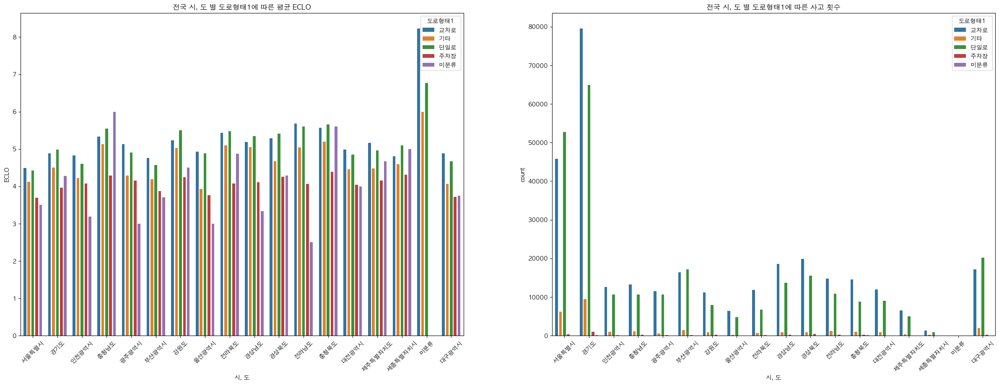

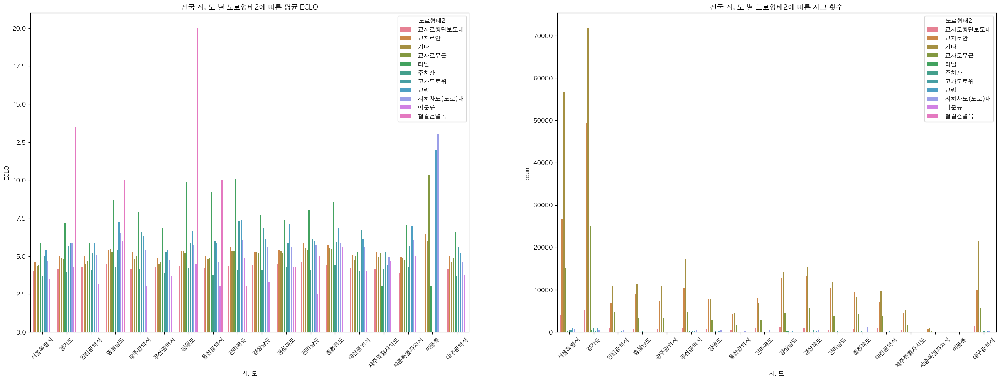

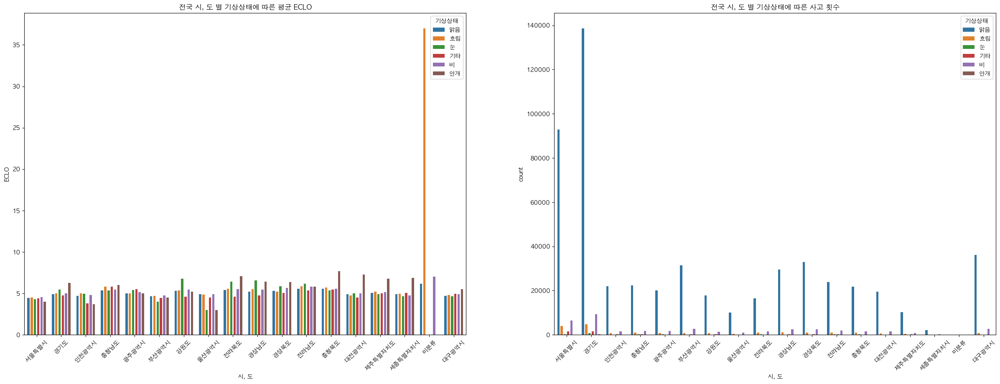

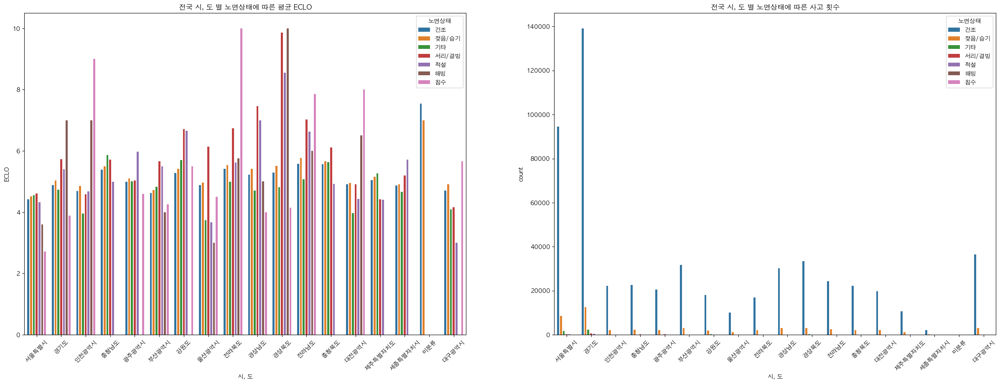

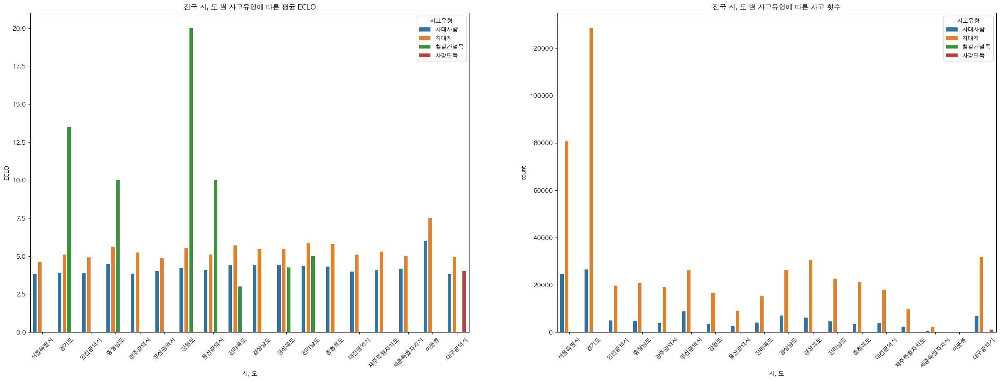

...

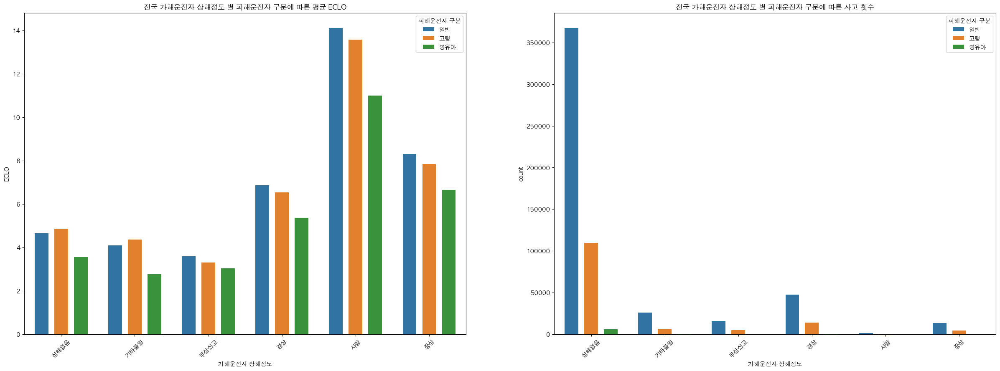

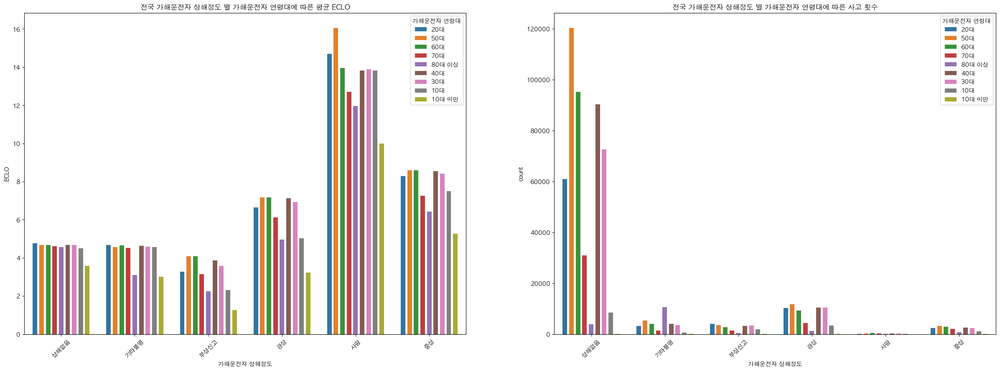

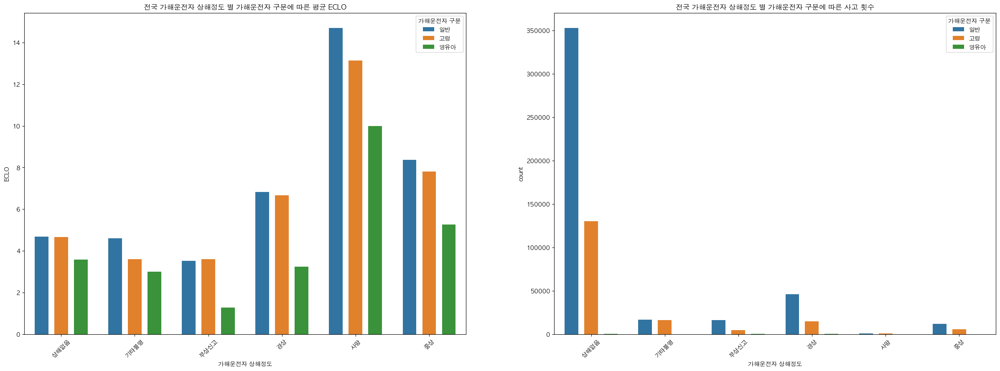

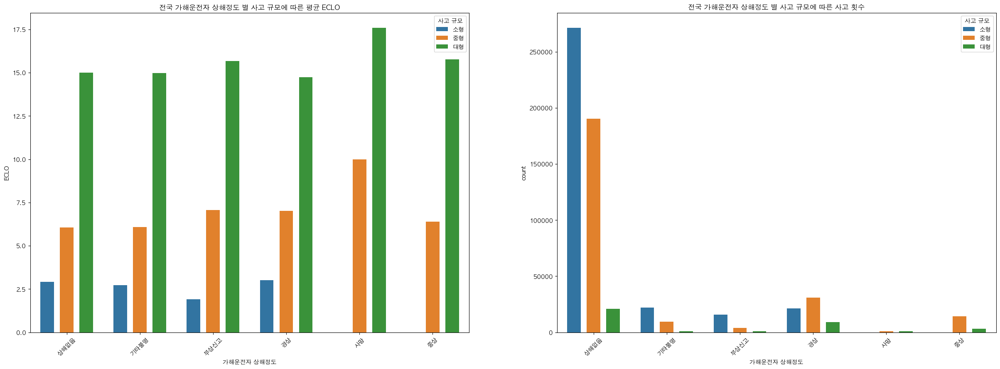

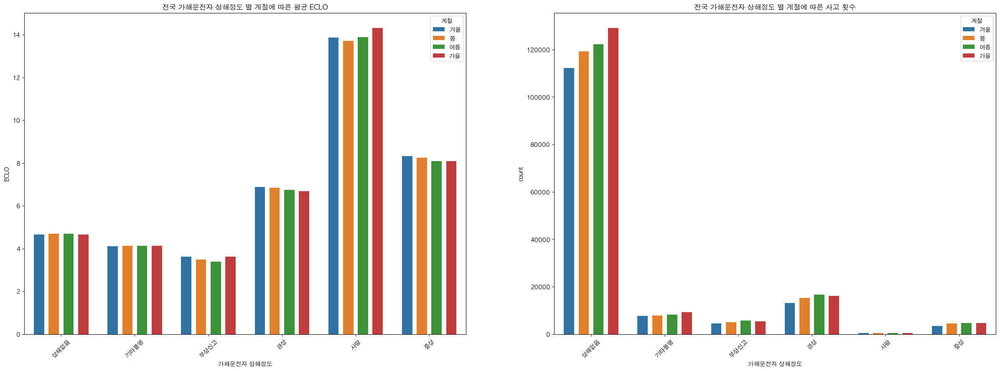

ValueError: cannot reindex on an axis with duplicate labels

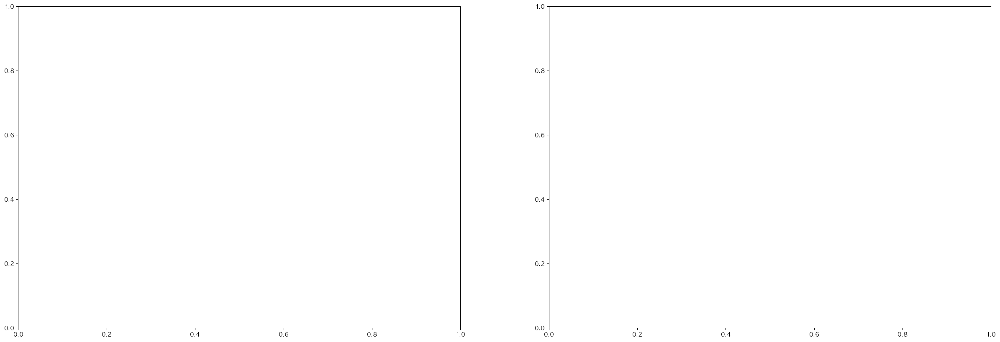

In [42]:
use_col1_list = []
for col1 in x_columns:
        use_col1_list.append(col1)
        use_col2_list = use_col1_list.copy()
        for col2 in x_columns:
                if col2 not in use_col2_list:
                    use_col2_list.append(col2)   
                    fig, (ax1, ax2) = plt.subplots(nrows=1,ncols=2, figsize=(30, 10))
                    sns.barplot(data=concat_data, x=col1, y="ECLO", hue=col2, gap=0.3, errorbar=None, ax=ax1)
                    sns.countplot(data=concat_data, x=col1, hue=col2, ax=ax2, gap=0.3)
                    ax1.set_title(f"전국 {col1} 별 {col2}에 따른 평균 ECLO")
                    ax1.set_xticklabels(ax1.get_xticklabels(), rotation = 45)
                    ax2.set_title(f"전국 {col1} 별 {col2}에 따른 사고 횟수")
                    ax2.set_xticklabels(ax2.get_xticklabels(), rotation = 45)
                    plt.show()     
                else:
                     pass

<Axes: xlabel='요일', ylabel='ECLO'>

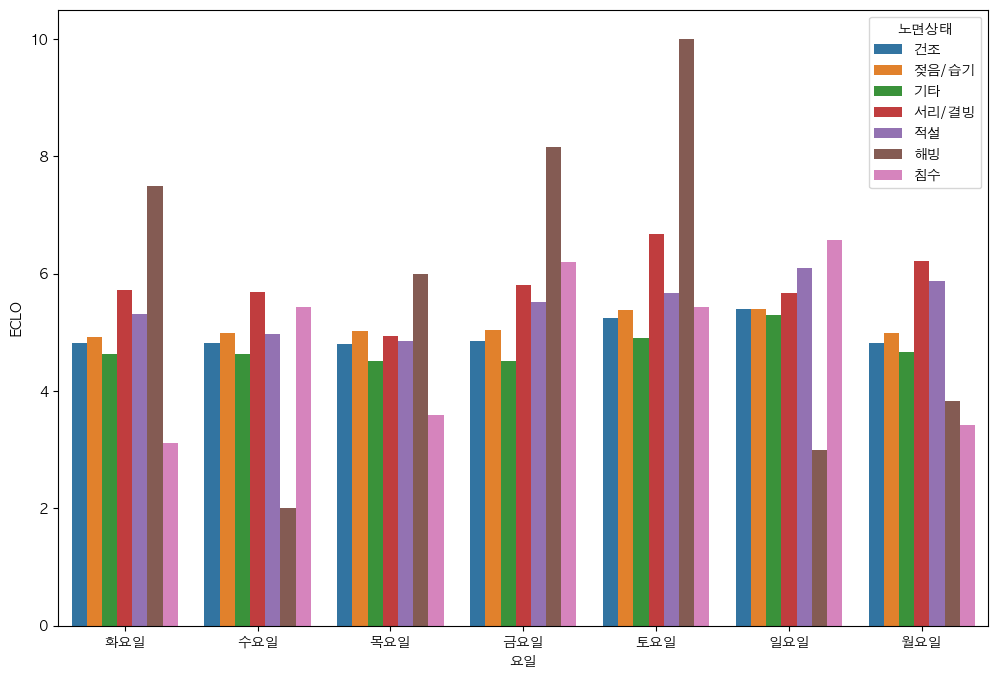

In [33]:
plt.figure(figsize=(12, 8))
sns.barplot(data=train_EDA, x="요일", y="ECLO", hue="노면상태", errorbar=None)

/Users/shindonghyuk/opt/anaconda3/envs/ML/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/shindonghyuk/opt/anaconda3/envs/ML/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/shindonghyuk/opt/anaconda3/envs/ML/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/shindonghyuk/opt/anaconda3/envs/ML/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and w

<Axes: xlabel='요일', ylabel='ECLO'>

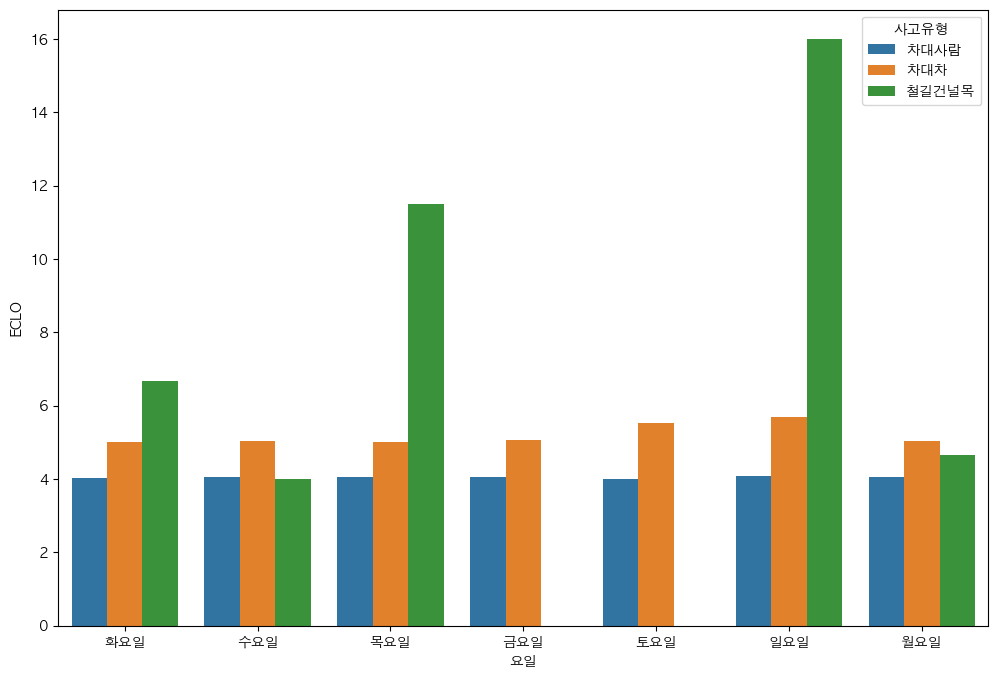

In [99]:
plt.figure(figsize=(12, 8))
sns.barplot(data=train_EDA, x="요일", y="ECLO", hue="사고유형", errorbar=None)